In [1]:
import json
import numpy as np
import pylab

In [141]:
import json
import numpy as np

sdict = json.load(open("/n/coxfs01/leek/results/2017-05-11_R0/synapse-connections.json"))
n1, n2 = [np.array(sdict[k]) for k in "neuron_1", "neuron_2"]
x, y, z = [np.array(sdict["synapse_center"][k]) for k in "xyz"]

def print_syn(idx):
    xx = int(x[idx])
    yy = int(y[idx])
    zz = int(z[idx])    
    print str(idx) + ': ' + str(n1[idx]) + ',' + str(n2[idx]) + ' (' + str(xx)+','+str(yy)+','+str(zz)+')'


In [142]:
print_syn(0)

0: 3555675,3555685 (436,549,15)


In [143]:
import tifffile
import cv2
bidx = json.load(open("/n/coxfs01/leek/data/ECS_iarpa201610_100um_100um_100um.json"))
bidx.keys()
def butterfly(x, y, z, width, height):
    col0 = max(x,0) / 1024
    col1 = (x+width+1023) / 1024
    
    row0 = max(y,0) / 1024
    row1 = (y+height+1023) / 1024
    result = np.zeros((height, width), np.uint8)
    pattern = bidx["sections"][z]
    
    for col in range(col0, col1):
        for row in range(row0, row1):
            x0 = max(0,max(x, col * 1024))
            x1 = min(x + width, (col+1) * 1024)
            y0 = max(0,max(y, row * 1024))
            y1 = min(y + height, (row+1) * 1024)
            #print x0,y0,x1,y1, pattern, row,col
            plane = cv2.imread(pattern.format(z=z, row=row+1, column=col+1), cv2.IMREAD_GRAYSCALE)
            print 'loading', pattern.format(z=z, row=row+1, column=col+1)
            result[y0-y:y1-y, x0-x:x1-x] = plane[y0-row * 1024: y1 - row * 1024,x0-col * 1024:x1-col *1024]
    return result
tiles = {}
for tile in json.load(open("/n/coxfs01/leek/results/2017-05-11_R0/boss/boss.json"))["tiles"]:
    tiles[tile["row"], tile["column"], tile["z"]] = tile["location"]
def bseg(x, y, z, width, height):
    col0 = max(x,0) / 2048
    col1 = (x+width+2047) / 2048
    row0 = max(y,0) / 2048
    row1 = (y+height+2047) / 2048
    result = np.zeros((height, width), np.uint32)
    for col in range(col0, col1):
        for row in range(row0, row1):
            x0 = max(0,max(x, col * 2048))
            x1 = min(x + width, (col+1) * 2048)
            y0 = max(0,max(y, row * 2048))
            y1 = min(y + height, (row+1) * 2048)
            plane = tifffile.imread(tiles[row, col, z])
            print 'loading', tiles[row, col, z]
            result[y0-y:y1-y, x0-x:x1-x] = plane[y0-row * 2048: y1 - row * 2048,
                                                 x0-col * 2048:x1-col *2048]
    return result
    

In [104]:
# from ipywidgets import interact
import pylab
def drawsd(idx):
    pylab.rcParams['figure.figsize']=(12, 12)
    ax = pylab.gca()
    xx = int(x[idx])
    yy = int(y[idx])
    zz = int(z[idx])
    ax.imshow(butterfly(xx-512, yy-512, zz, 1024, 1024), cmap='gray')
    seg = bseg(xx-512, yy-512, zz, 1024, 1024)
    cimg = np.zeros((1024, 1024, 4))
    cimg[seg == n1[idx], 0] = 1
    cimg[seg == n1[idx], 3] = .3
    cimg[seg == n2[idx], 1] = 1
    cimg[seg == n2[idx], 3] = .3
    ax.imshow(cimg)
    ax.set_xlim(0, 1024)
    ax.set_ylim(1024, 0)
    ax.plot(512, 512, "ro")
    
    #print 'showing synapse between pre:',n1[idx],'post:',n2[idx] 
    
    print str(idx) + ': ' + str(n1[idx]) + ',' + str(n2[idx]) + ' (' + str(xx)+','+str(yy)+','+str(zz)+')'

    
    pylab.show()

In [69]:
import random

In [89]:
good_ones = [1337,31337,44,66,8765,10001,332211,547632,67453,1728,36617,703228,285652]

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0784_W04_Sec016_montaged/0784_W04_Sec016_montaged_tr1-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0784_W04_Sec016_montaged/0784_W04_Sec016_montaged_tr2-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0784_W04_Sec016_montaged/0784_W04_Sec016_montaged_tr1-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0784_W04_Sec016_montaged/0784_W04_Sec016_montaged_tr2-tc2.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00783/seg_r0_c0.tif
1337: 429824,424283 (1290,1051,783)


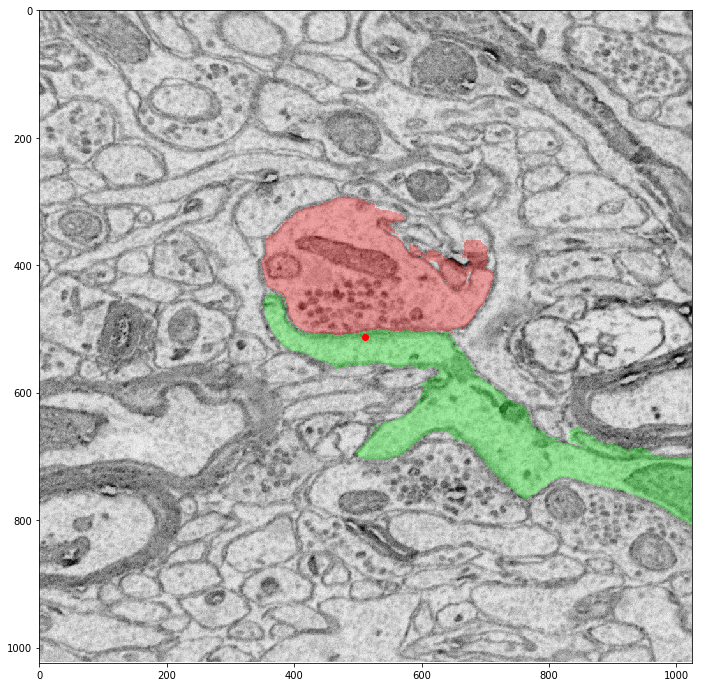

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0170_W01_Sec170_montaged/0170_W01_Sec170_montaged_tr11-tc3.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0170_W01_Sec170_montaged/0170_W01_Sec170_montaged_tr12-tc3.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0170_W01_Sec170_montaged/0170_W01_Sec170_montaged_tr11-tc4.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0170_W01_Sec170_montaged/0170_W01_Sec170_montaged_tr12-tc4.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00169/seg_r5_c1.tif
31337: 3210083,1320528 (3431,11667,169)


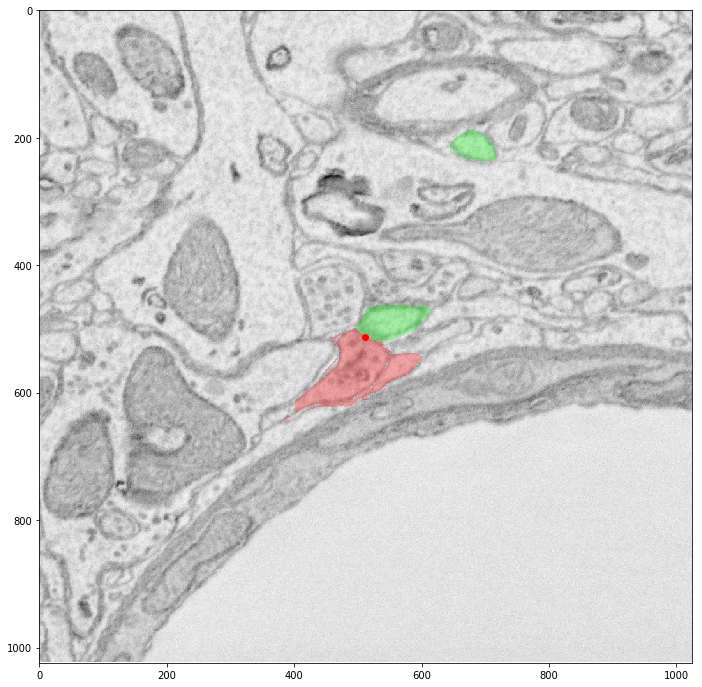

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0036_W01_Sec036_montaged/0036_W01_Sec036_montaged_tr1-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0036_W01_Sec036_montaged/0036_W01_Sec036_montaged_tr2-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0036_W01_Sec036_montaged/0036_W01_Sec036_montaged_tr1-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0036_W01_Sec036_montaged/0036_W01_Sec036_montaged_tr2-tc2.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00035/seg_r0_c0.tif
44: 3555746,32073 (1029,1126,35)


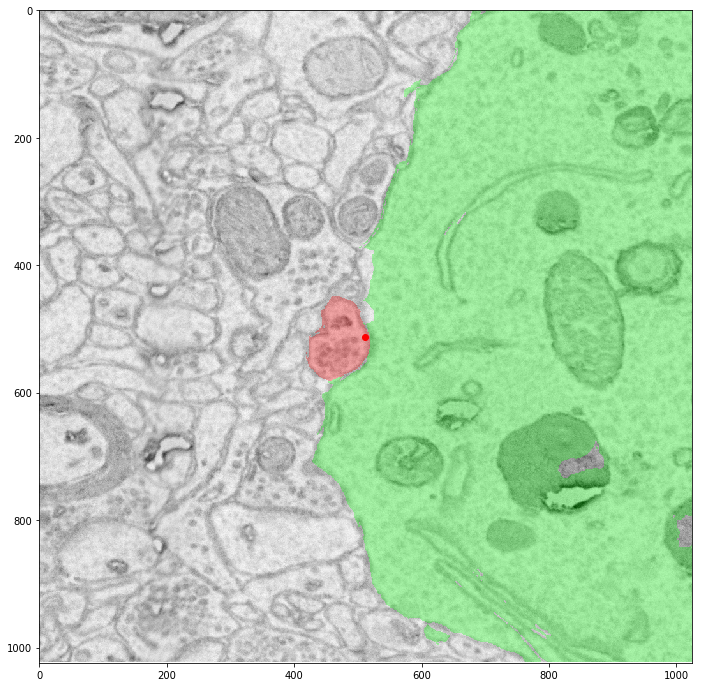

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0050_W01_Sec050_montaged/0050_W01_Sec050_montaged_tr1-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0050_W01_Sec050_montaged/0050_W01_Sec050_montaged_tr2-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0050_W01_Sec050_montaged/0050_W01_Sec050_montaged_tr1-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0050_W01_Sec050_montaged/0050_W01_Sec050_montaged_tr2-tc2.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00049/seg_r0_c0.tif
66: 3556547,2068787 (644,561,49)


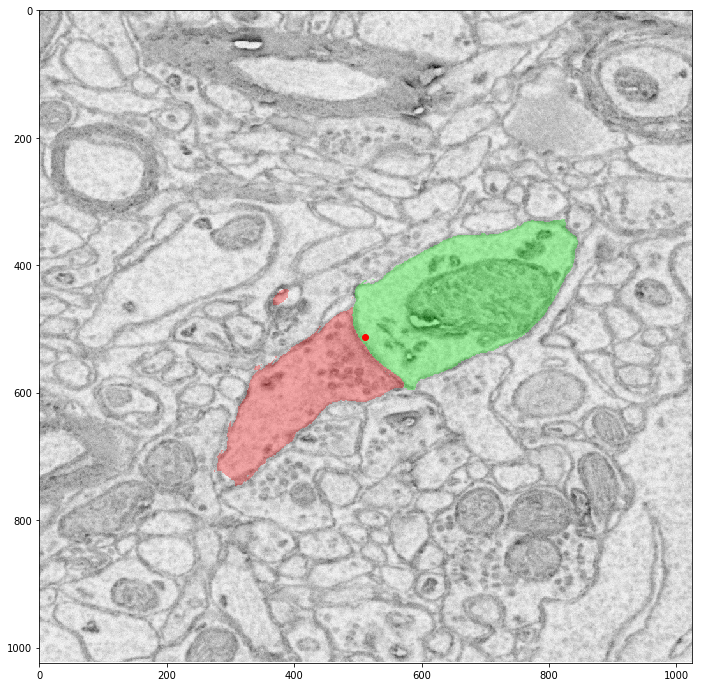

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0190_W01_Sec190_montaged/0190_W01_Sec190_montaged_tr8-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0190_W01_Sec190_montaged/0190_W01_Sec190_montaged_tr9-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0190_W01_Sec190_montaged/0190_W01_Sec190_montaged_tr8-tc3.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0190_W01_Sec190_montaged/0190_W01_Sec190_montaged_tr9-tc3.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00189/seg_r3_c0.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00189/seg_r4_c0.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00189/seg_r3_c1.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00189/seg_r4_c1.tif
8765: 284731,284880 (1900,8652,189)


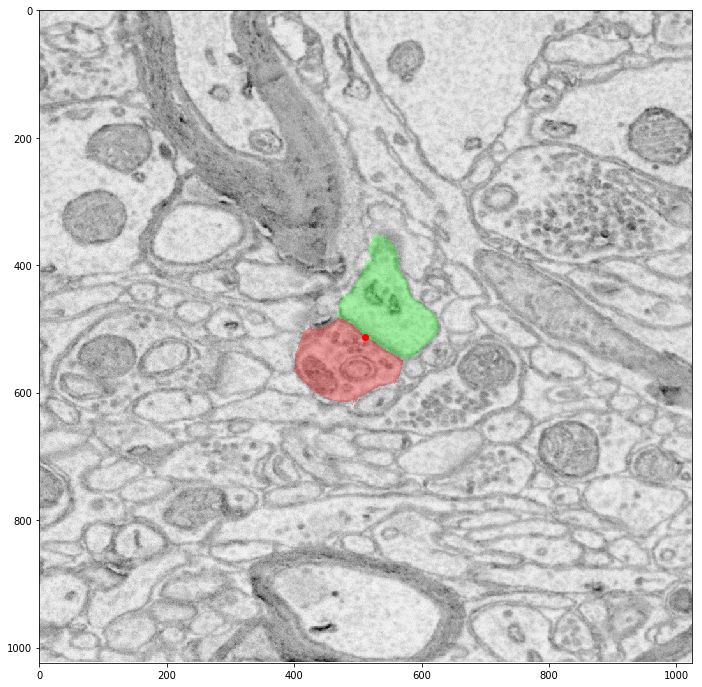

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0970_W04_Sec202_montaged/0970_W04_Sec202_montaged_tr8-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0970_W04_Sec202_montaged/0970_W04_Sec202_montaged_tr9-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0970_W04_Sec202_montaged/0970_W04_Sec202_montaged_tr8-tc3.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0970_W04_Sec202_montaged/0970_W04_Sec202_montaged_tr9-tc3.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00969/seg_r3_c0.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00969/seg_r4_c0.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00969/seg_r3_c1.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00969/seg_r4_c1.tif
10001: 2048829,28 (2293,8190,969)


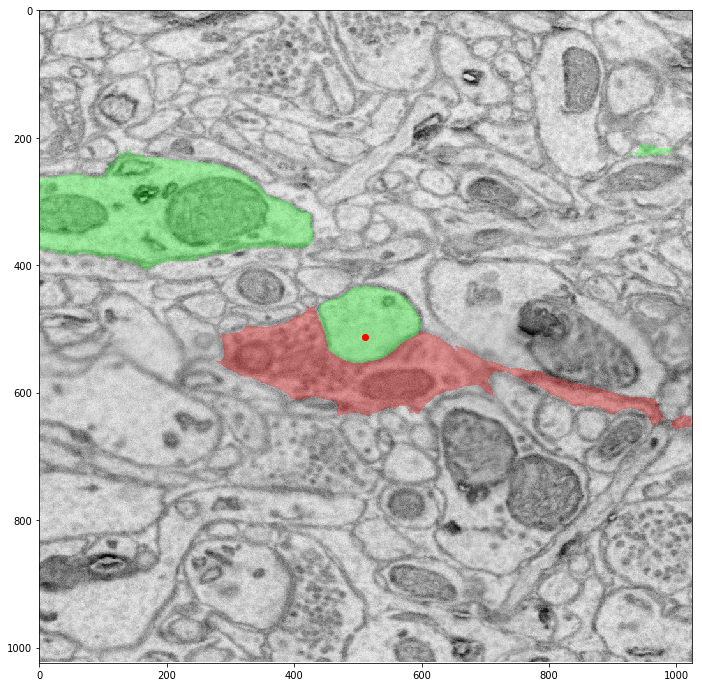

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/2715_W11_Sec144_montaged/2715_W11_Sec144_montaged_tr13-tc5.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/2715_W11_Sec144_montaged/2715_W11_Sec144_montaged_tr14-tc5.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/2715_W11_Sec144_montaged/2715_W11_Sec144_montaged_tr13-tc6.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/2715_W11_Sec144_montaged/2715_W11_Sec144_montaged_tr14-tc6.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/02714/seg_r6_c2.tif
332211: 4450322,2 (5628,13203,2714)


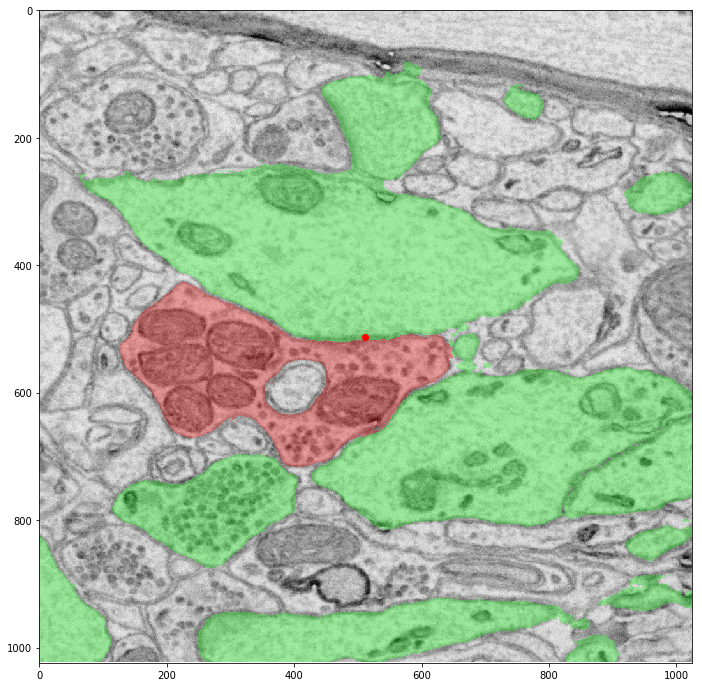

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1319_W06_Sec032_montaged/1319_W06_Sec032_montaged_tr1-tc21.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1319_W06_Sec032_montaged/1319_W06_Sec032_montaged_tr2-tc21.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1319_W06_Sec032_montaged/1319_W06_Sec032_montaged_tr1-tc22.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1319_W06_Sec032_montaged/1319_W06_Sec032_montaged_tr2-tc22.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/01318/seg_r0_c10.tif
547632: 1905331,43976 (21472,709,1318)


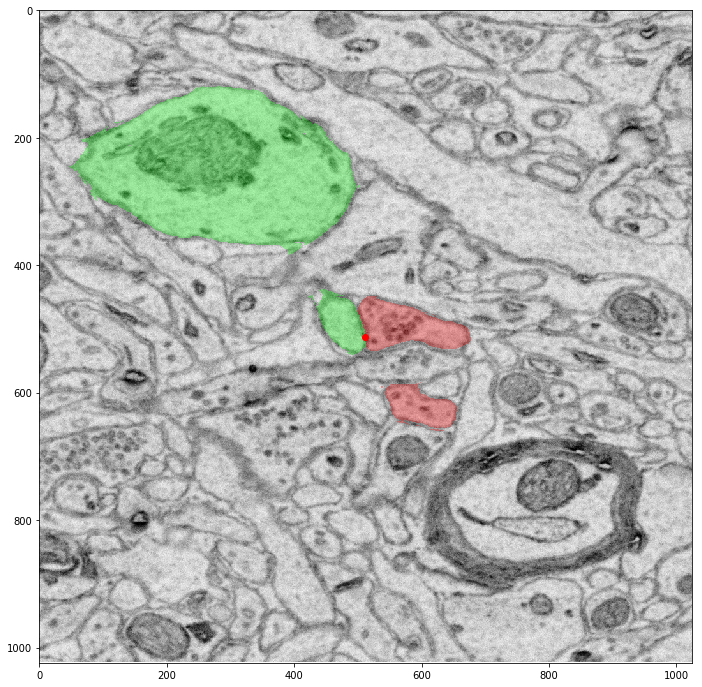

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0541_W03_Sec024_montaged/0541_W03_Sec024_montaged_tr2-tc9.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0541_W03_Sec024_montaged/0541_W03_Sec024_montaged_tr3-tc9.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0541_W03_Sec024_montaged/0541_W03_Sec024_montaged_tr2-tc10.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0541_W03_Sec024_montaged/0541_W03_Sec024_montaged_tr3-tc10.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00540/seg_r0_c4.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00540/seg_r1_c4.tif
67453: 786791,786790 (9582,2357,540)


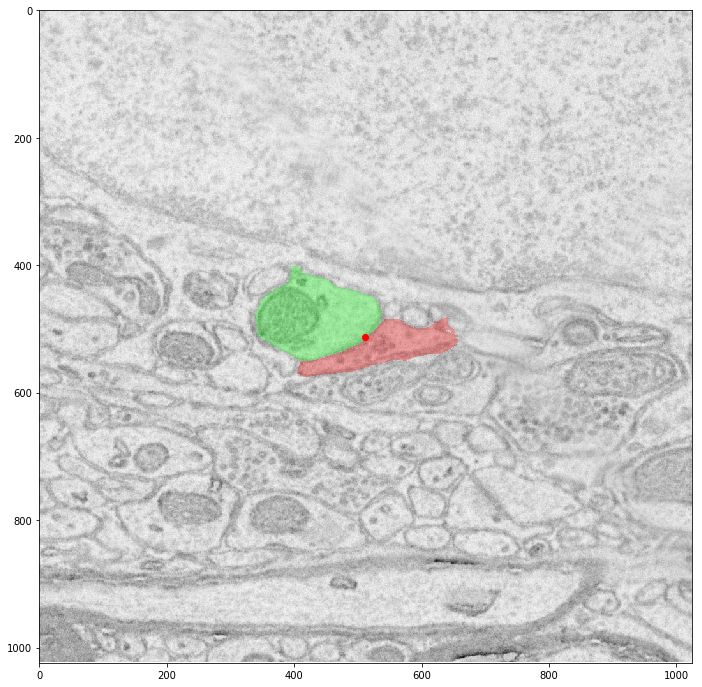

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0920_W04_Sec152_montaged/0920_W04_Sec152_montaged_tr2-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0920_W04_Sec152_montaged/0920_W04_Sec152_montaged_tr3-tc1.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0920_W04_Sec152_montaged/0920_W04_Sec152_montaged_tr2-tc2.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0920_W04_Sec152_montaged/0920_W04_Sec152_montaged_tr3-tc2.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00919/seg_r0_c0.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00919/seg_r1_c0.tif
1728: 2920438,2 (1066,2397,919)


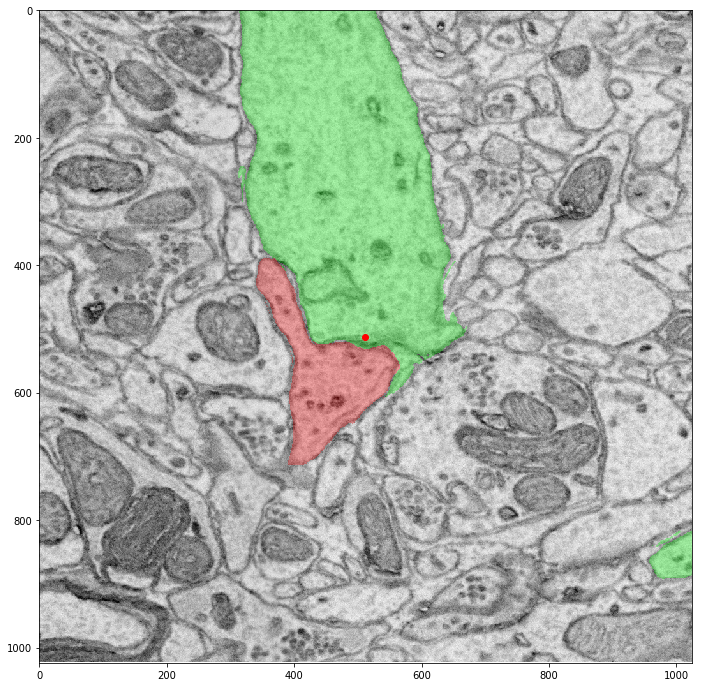

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0116_W01_Sec116_montaged/0116_W01_Sec116_montaged_tr3-tc6.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0116_W01_Sec116_montaged/0116_W01_Sec116_montaged_tr4-tc6.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0116_W01_Sec116_montaged/0116_W01_Sec116_montaged_tr3-tc7.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0116_W01_Sec116_montaged/0116_W01_Sec116_montaged_tr4-tc7.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00115/seg_r1_c2.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00115/seg_r1_c3.tif
36617: 1770626,1772339 (5820,3518,115)


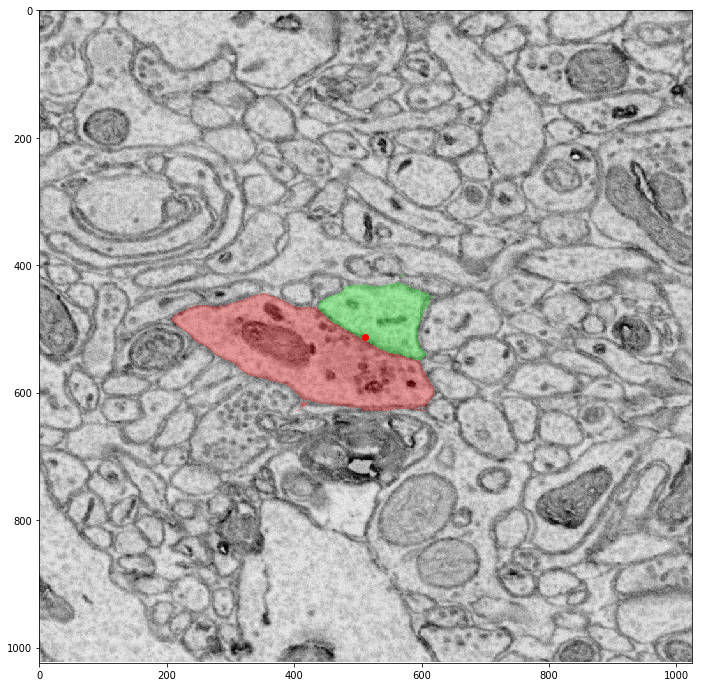

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0772_W04_Sec004_montaged/0772_W04_Sec004_montaged_tr18-tc4.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0772_W04_Sec004_montaged/0772_W04_Sec004_montaged_tr19-tc4.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0772_W04_Sec004_montaged/0772_W04_Sec004_montaged_tr18-tc5.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/0772_W04_Sec004_montaged/0772_W04_Sec004_montaged_tr19-tc5.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00771/seg_r8_c1.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00771/seg_r9_c1.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00771/seg_r8_c2.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/00771/seg_r9_c2.tif
703228: 16669,274447 (4506,17960,771)


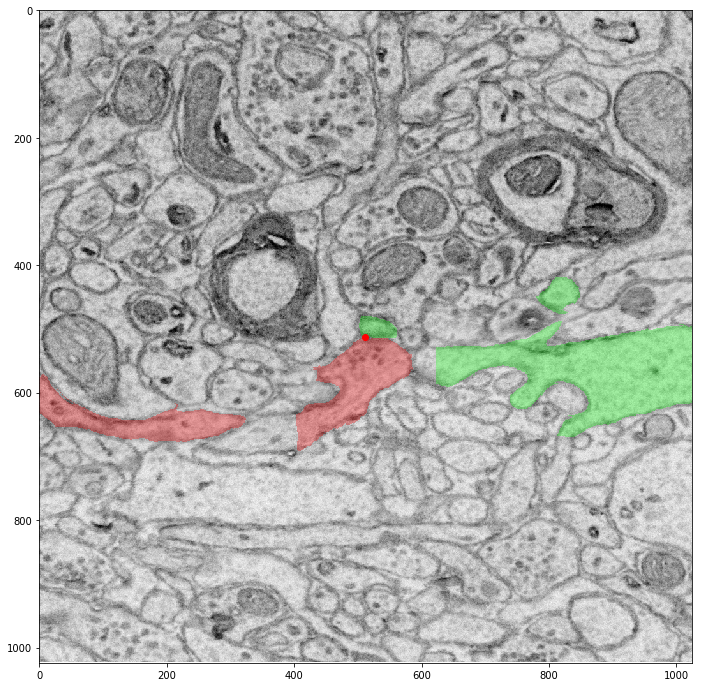

loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1949_W08_Sec157_montaged/1949_W08_Sec157_montaged_tr6-tc23.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1949_W08_Sec157_montaged/1949_W08_Sec157_montaged_tr7-tc23.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1949_W08_Sec157_montaged/1949_W08_Sec157_montaged_tr6-tc24.png
loading /n/coxfs01/data/ECS_iarpa201610_100um_100um_100um_tiles_raw/1949_W08_Sec157_montaged/1949_W08_Sec157_montaged_tr7-tc24.png
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/01948/seg_r2_c11.tif
loading /n/coxfs01/leek/results/2017-05-11_R0/boss/01948/seg_r3_c11.tif
285652: 6716945,6717057 (23911,5671,1948)


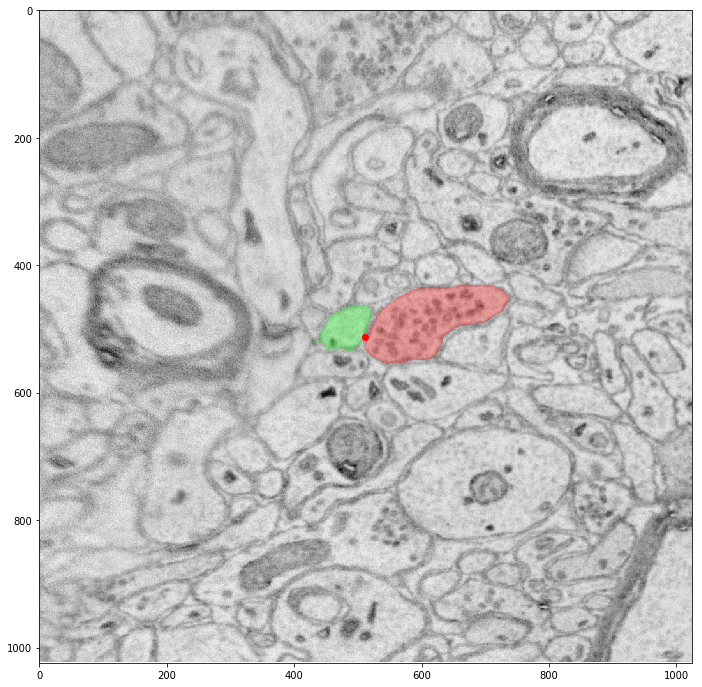

In [144]:
for g in good_ones:
    drawsd(g)

In [43]:
n1[444]

3913168

In [44]:
n2[444]

612601

616426

In [107]:
len(n2)

777176

1: 3555693,3555695 (238,630,17)


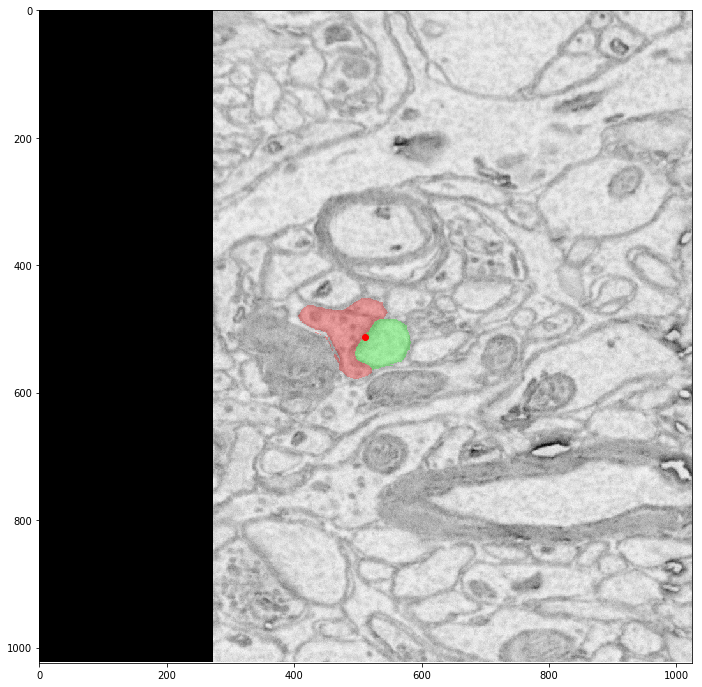

In [139]:
drawsd(1)

In [123]:
-76/1024

-1

In [1]:
import random

In [2]:
import numpy as np

In [3]:
np.random.randint(0, len(n1))

NameError: name 'n1' is not defined